In [1]:
from transformers import AutoProcessor, PaliGemmaForConditionalGeneration
from PIL import Image
import requests
import torch

## UNCOMMENT TO GET A TOKEN IF FIRST TIME RUNNING
# from huggingface_hub import login
# login()

### different models to try...
# model_id = "google/paligemma-3b-mix-448"
# "google/paligemma-3b-ft-textvqa-896" 
# "google/paligemma-3b-mix-224"
# "google/paligemma-3b-ft-docvqa-896"
# "google/paligemma-3b-mix-448"

#model_id = "google/paligemma-3b-ft-textvqa-896"

model_id = "google/paligemma-3b-ft-docvqa-896" 
device = "mps"  # Use "cpu" if you prefer CPU processing
dtype = torch.float32  # Use float32 for better compatibility

model = PaliGemmaForConditionalGeneration.from_pretrained(
    model_id,
    torch_dtype=dtype,
    device_map=device,
).eval()
processor = AutoProcessor.from_pretrained(model_id)


/Users/bigdaddy/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/bigdaddy/Library/Python/3.9/lib/python/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/Users/bigdaddy/Library/Python/3.9/lib/python/site-packages/transformers/models/paligemma/configuration_paligemma.py:137: FutureWarning: The `vocab_size` attribute is deprecated and will be removed in v4.44, Please use `text_config.vocab_size` instead.
  warnings.warn(
`config.hidden_act` is ignored, you should use `config.hidden_activation` instead.
Gemma's activation function will be set to `gelu_pytorch_tanh`. Please, use
`config.hidden_activation` if y

In [2]:
def get_prompt_response(prompt):
    model_inputs = processor(text=prompt, images=image, return_tensors="pt").to(model.device)
    input_len = model_inputs["input_ids"].shape[-1]
    with torch.inference_mode():
        generation = model.generate(**model_inputs, max_new_tokens=100, do_sample=False)
        generation = generation[0][input_len:]
        decoded = processor.decode(generation, skip_special_tokens=True)
        return decoded

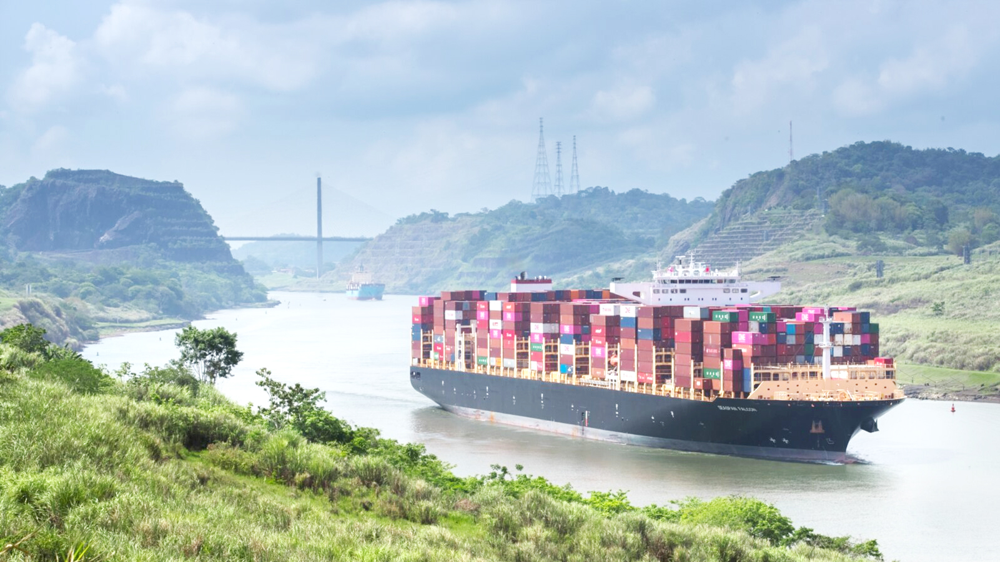

In [3]:
#url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/tasks/car.jpg?download=true"
url = "./img/boat.jpg"
#url = "./img/car.jpg"
#url = "./img/drivingSigns.jpg"
#image = Image.open(requests.get(url, stream=True).raw)
image = Image.open(url)
image

In [4]:
get_prompt_response("How many containers are on the boat nearest to us?")


'4500'

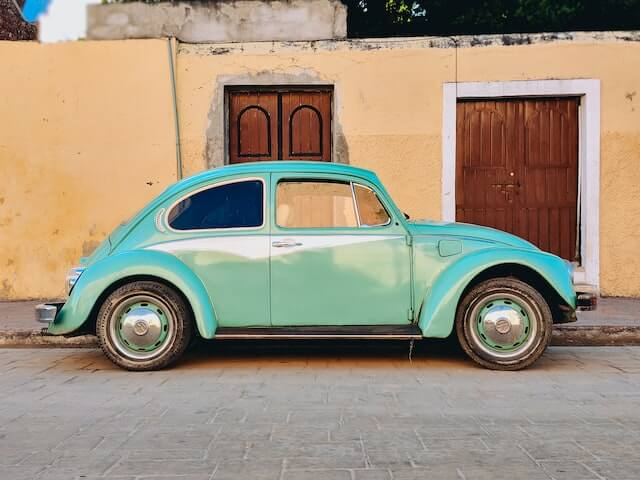

In [5]:
#url = "./img/boat.jpg"
url = "./img/car.jpg"
#url = "./img/drivingSigns.jpg"
#image = Image.open(requests.get(url, stream=True).raw)
image = Image.open(url)
image

In [6]:
get_prompt_response("Describe this scene.")

'Car'

In [7]:
get_prompt_response("What decade is this car from?")

'1960'

In [8]:
get_prompt_response("What is the make and model of this car?")

'Volkswagen Beetle'

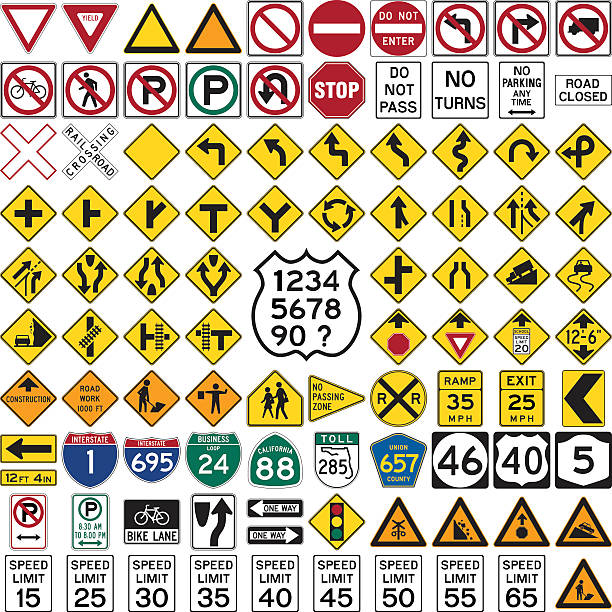

In [9]:
#url = "./img/boat.jpg"
#url = "./img/car.jpg"
url = "./img/drivingSigns.jpg"

image = Image.open(url)
image

In [10]:
get_prompt_response("What does the sign on the bottom left say? What does it mean?")


'15'

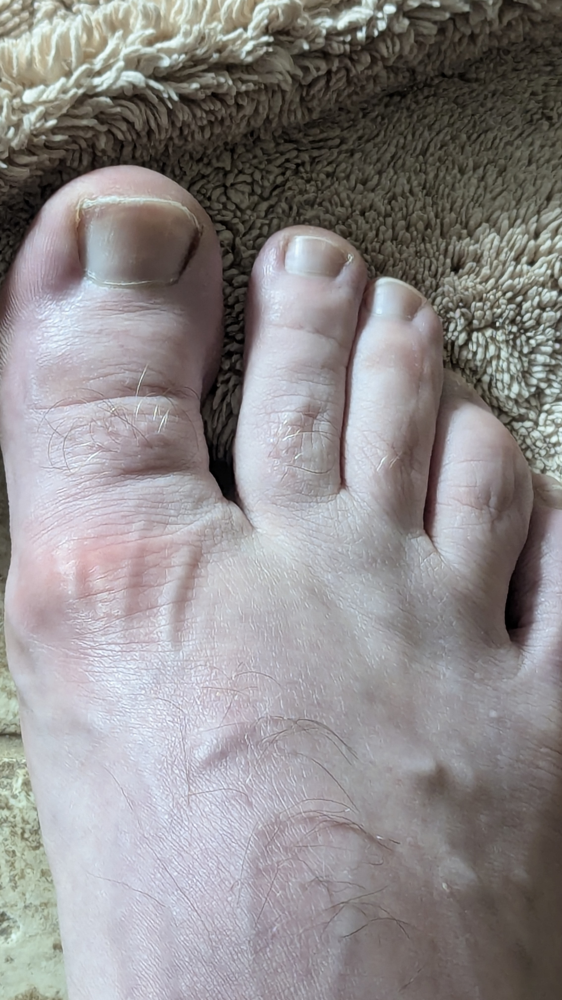

In [11]:
#url = "./img/boat.jpg"
#url = "./img/car.jpg"
#url = "./img/drivingSigns.jpg"
url = "./img/foot.jpg"

image = Image.open(url)
image

In [12]:
get_prompt_response("How does my foot look? My big toe hurts.")

'What should i do?'

In [13]:
get_prompt_response("Does the big toe look swollen?")


'yes'

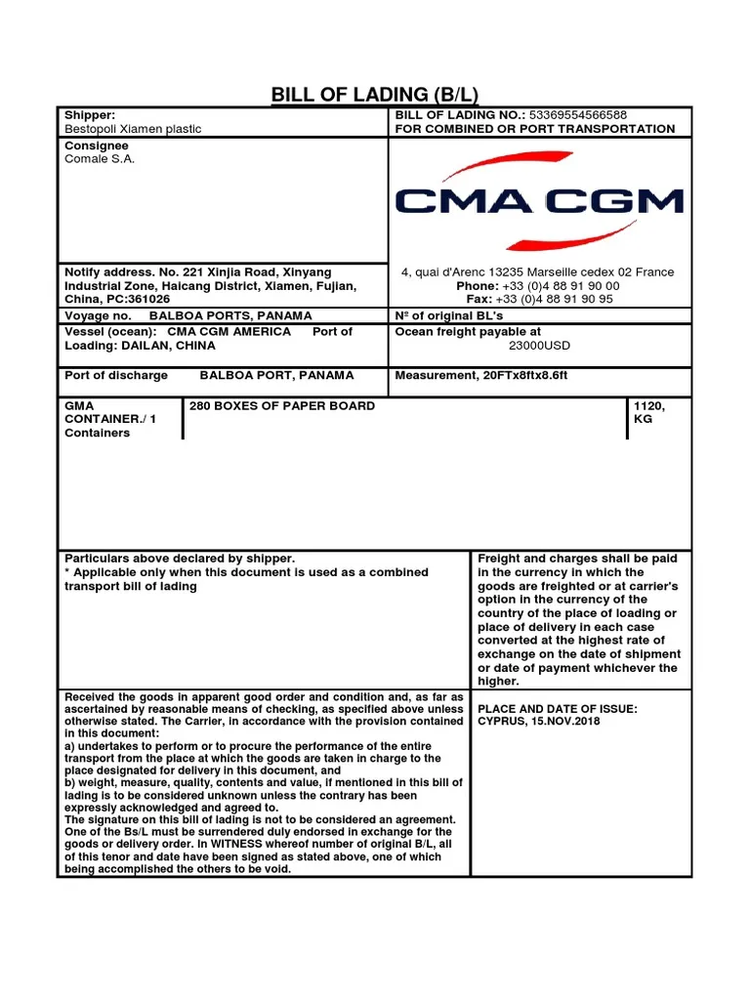

In [14]:
#url = "./img/boat.jpg"
#url = "./img/car.jpg"
#url = "./img/drivingSigns.jpg"
url = "./img/billOfLading.webp"

image = Image.open(url)
image

In [15]:
get_prompt_response("What type of document is this?")

'BILL OF LADING'

In [16]:
get_prompt_response("OCR What is the name of the shipper?")

'Bestopoll Xlamen plastic consignee Conrale S.A.'

In [17]:
get_prompt_response("OCR What is the amount payable?")

'23000usd'

In [20]:
get_prompt_response("OCR What is the KG weight?")

'1120,'